<a href="https://colab.research.google.com/github/VarshithaKrishna/ML/blob/main/Animal_Images_Classification_DL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Import necessary libraries
import numpy as np
import pandas as pd
import os
import tensorflow as tf
from tensorflow import keras
import kagglehub

# 📥 Step 1: Download & Verify Dataset
dataset_path = kagglehub.dataset_download('likhon148/animal-data')
print("Dataset downloaded to:", dataset_path)

# Check extracted folder structure
print("Contents:", os.listdir(dataset_path))

# Set correct dataset path
correct_path = os.path.join(dataset_path, 'animal_data')

# Verify if the dataset folder exists
if not os.path.exists(correct_path):
    raise FileNotFoundError(f"Dataset directory '{correct_path}' not found. Check dataset structure.")

# 📊 Step 2: Load Dataset
dataset = keras.utils.image_dataset_from_directory(
    directory=correct_path,
    labels='inferred',
    label_mode='int',
    batch_size=32,
    image_size=(256, 256),
)

print("Dataset loaded successfully!")


100%|██████████| 36.3M/36.3M [00:00<00:00, 64.8MB/s]

Extracting files...


Dataset downloaded to: /root/.cache/kagglehub/datasets/likhon148/animal-data/versions/1
Contents: ['animal_data']
Found 1944 files belonging to 15 classes.
Dataset loaded successfully!


In [ ]:
dataset_size = len(dataset)
train_size = int(0.8 * dataset_size)
val_size = dataset_size - train_size
train_ds = dataset.take(train_size)
val_ds = dataset.skip(train_size).take(val_size)

# ڈیٹا کو بہتر بنانا
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
# this function is sepreted label and images
def dataset_to_tensors(dataset):
    images = []
    labels = []
    for img, lbl in dataset.unbatch():
        images.append(img.numpy())
        labels.append(lbl.numpy())
    return tf.convert_to_tensor(images), tf.convert_to_tensor(labels)

In [ ]:
# x_train, y_train, x_test, y_test
x_train, y_train = dataset_to_tensors(train_ds) #dataset_to_tensors is function where we seprate  images and label
x_test, y_test = dataset_to_tensors(val_ds)

[]

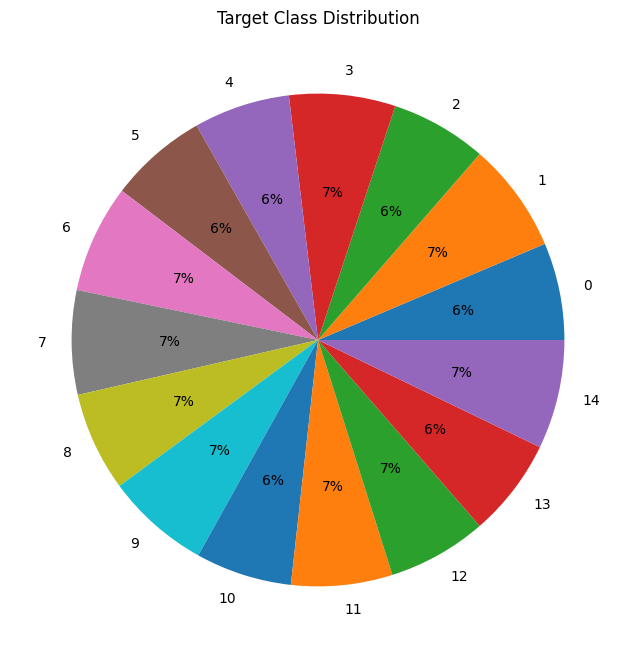

In [ ]:
import os
unique, count=np.unique(y_train, return_counts=True)
plt.figure(figsize=(10, 8))
plt.pie(count, labels=unique, autopct='%.0f%%')
plt.title('Target Class Distribution')
plt.plot()

In [ ]:
# Creating a function to visualize the images

def visualize_images(path, num_images=5):

    # Get a list of image filenames
    image_filenames = [f for f in os.listdir(path) if os.path.isfile(os.path.join(path, f))]

    #if not image_filenames:
        #raise ValueError("No images found in the specified path")

    # Select random images
    selected_images = random.sample(image_filenames, min(num_images, len(image_filenames)))

    # Create a figure and axes
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3), facecolor='white')

    # Display each image
    for i, image_filename in enumerate(selected_images):
        # Load image
        image_path = os.path.join(path, image_filename)
        image = plt.imread(image_path)

        # Display image
        axes[i].imshow(image)
        axes[i].axis('off')
        axes[i].set_title(image_filename)  # Set image filename as title

    # Adjust layout and display
    plt.tight_layout()
    plt.show()

In [ ]:
# Extrating the class labels
classes = dataset.class_names
print(f'{classes}')

['Bear', 'Bird', 'Cat', 'Cow', 'Deer', 'Dog', 'Dolphin', 'Elephant', 'Giraffe', 'Horse', 'Kangaroo', 'Lion', 'Panda', 'Tiger', 'Zebra']


Classes Found: ['Bird', 'Dog', 'Kangaroo', 'Deer', 'Elephant', 'Giraffe', 'Panda', 'Cat', 'Zebra', 'Dolphin', 'Horse', 'Tiger', 'Bear', 'Cow', 'Lion']
BIRD


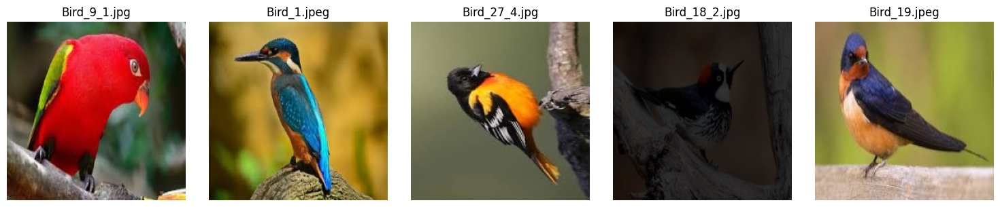

DOG


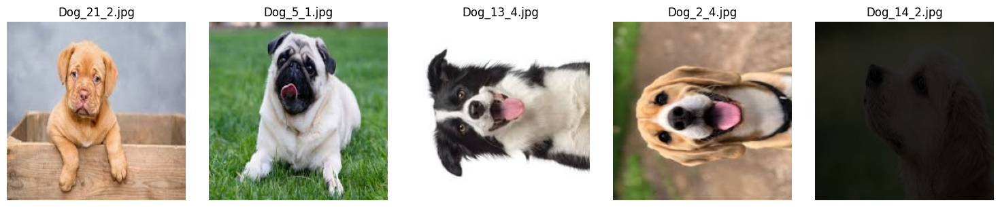

KANGAROO


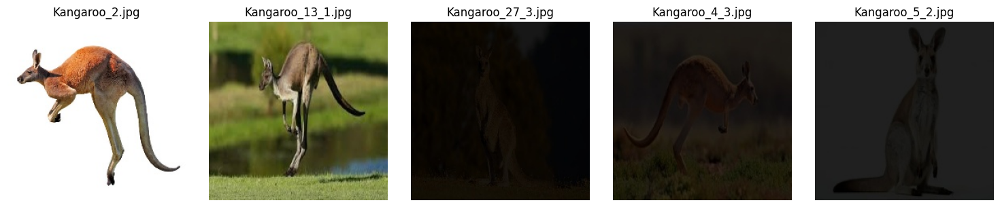

DEER


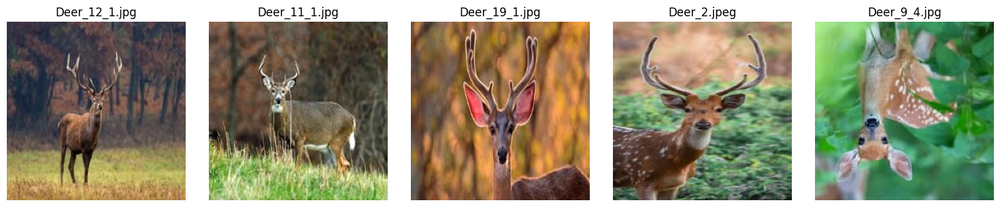

ELEPHANT


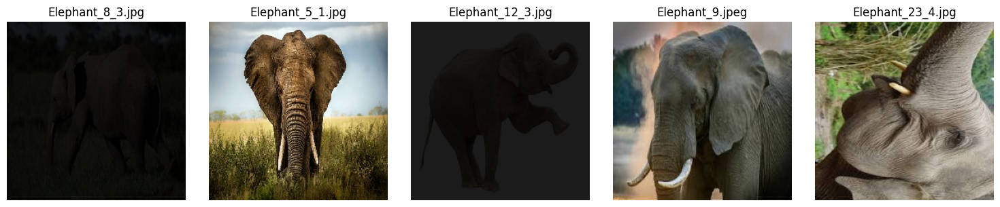

GIRAFFE


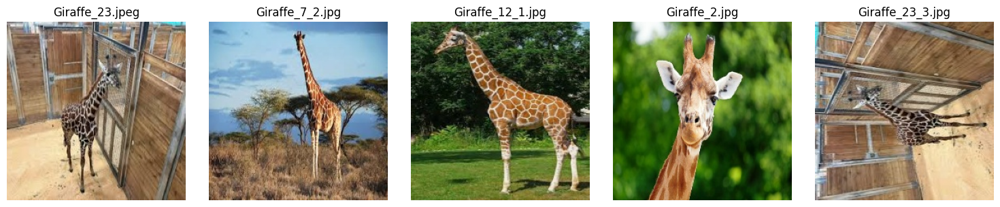

PANDA


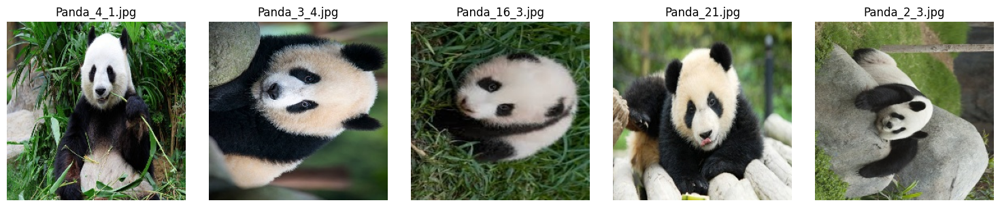

CAT


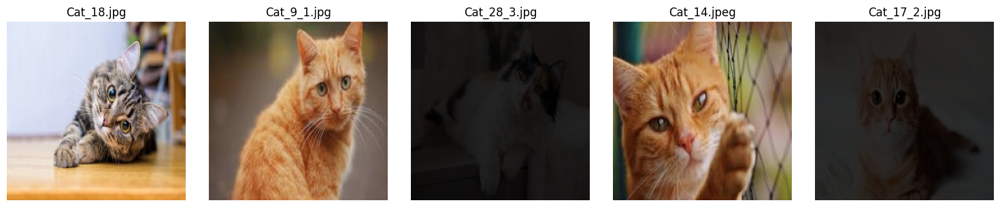

ZEBRA


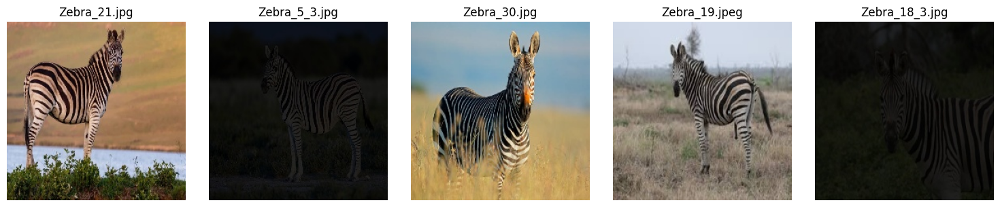

DOLPHIN


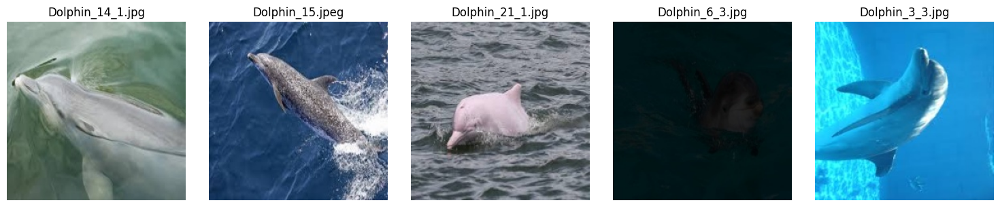

HORSE


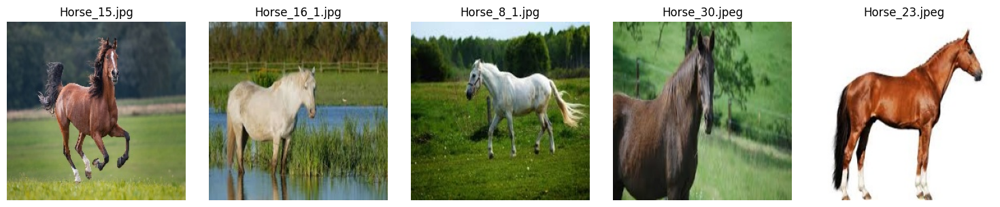

TIGER


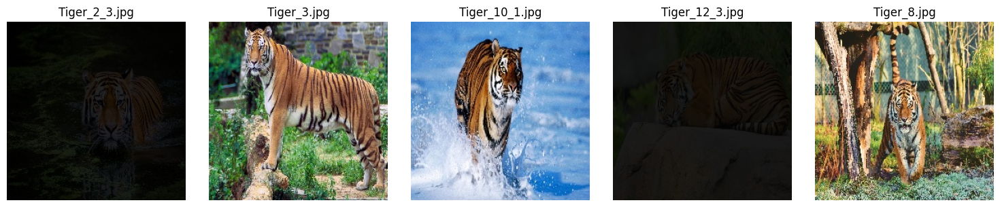

BEAR


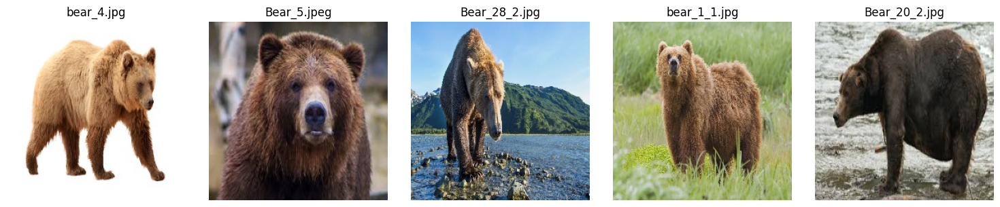

COW


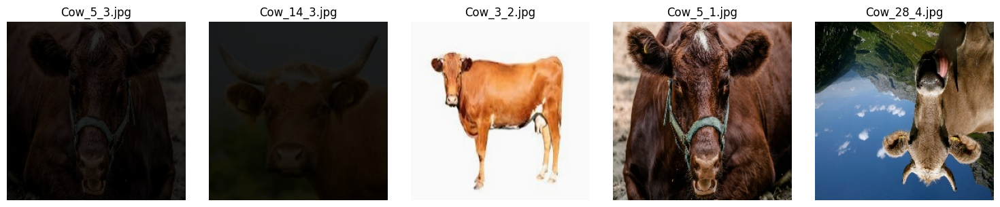

LION


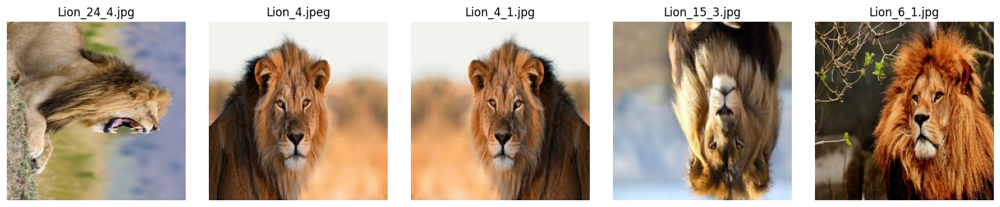

In [ ]:
import os
import kagglehub

# 📥 Step 1: Download Dataset
dataset_path = kagglehub.dataset_download('likhon148/animal-data')
correct_path = os.path.join(dataset_path, 'animal_data')

# Check if dataset exists
if not os.path.exists(correct_path):
    raise FileNotFoundError(f"Dataset directory '{correct_path}' not found. Check dataset structure.")

# 📊 Step 2: Get Classes
classes = os.listdir(correct_path)
print("Classes Found:", classes)

# 📸 Step 3: Visualize Images
for label in classes:
    path_to_visualize = os.path.join(correct_path, label)

    if not os.path.exists(path_to_visualize):
        print(f"Skipping {label} (Path Not Found)")
        continue

    print(label.upper())
    visualize_images(path_to_visualize, num_images=5)


## **Min-Max Scalling**

In [ ]:
# Convert the data type of the images to float32
x_train = tf.cast(x_train, tf.float32)  # tf.cast is used to convert the image tensors to float32.
x_test = tf.cast(x_test, tf.float32)

# Normalize the pixel values to a range between 0 and 1
x_train /= 255.0
x_test /= 255.0  #The pixel values of the images are normalized by dividing by 255.0.

# Print the shapes of the original training data and labels
print("X_train shape: {} \nY_train shape: {}".format(x_train.shape, y_train.shape))
print("X_test shape: {} \nY_test shape: {}".format(x_test.shape, y_test.shape))

X_train shape: (1536, 256, 256, 3) 
Y_train shape: (1536,)
X_test shape: (408, 256, 256, 3) 
Y_test shape: (408,)


# **Processing the Target variable**

In [ ]:
from tensorflow.keras.utils import to_categorical
# Convert class vectors to binary class matrices / one-hot encoding
y_train = to_categorical(y_train, 15)
y_test = to_categorical(y_test, 15)

In [ ]:
y_train[3]

<tf.Tensor: shape=(15,), dtype=float32, numpy=
array([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)>

### Define CNN Architecture

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
# Define the CNN model
model = Sequential()
# Conv2D layer with 32 filters, kernel size 3x3, input shape (32, 32, 3)
# Input size: 32x32x3, Kernel size: 3x3, Number of kernels: 32, Output size: 30x30x32. [input_size-kernel]+1
model.add(Conv2D(92, (3, 3), activation='relu', input_shape=(256, 256, 3)))
model.add(BatchNormalization())
# MaxPooling2D layer with pool size 2x2
# Output size: 15x15x32
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))

#model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

# Conv2D layer with 64 filters, kernel size 3x3
# Input size: 15x15x32, Kernel size: 3x3, Number of kernels: 64, Output size: 13x13x64
model.add(Conv2D(84, (3, 3), activation='relu'))
model.add(BatchNormalization())
# MaxPooling2D layer with pool size 2x2
# Output size: 6x6x64
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))

# Conv2D layer with 64 filters, kernel size 3x3
# Input size: 15x15x32, Kernel size: 3x3, Number of kernels: 64, Output size: 13x13x64
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(BatchNormalization())
# MaxPooling2D layer with pool size 2x2
# Output size: 6x6x64
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))




# Conv2D layer with 64 filters, kernel size 3x3
# Input size: 15x15x32, Kernel size: 3x3, Number of kernels: 64, Output size: 13x13x64
model.add(Conv2D(54, (3, 3), activation='relu'))
model.add(BatchNormalization())
# MaxPooling2D layer with pool size 2x2
# Output size: 6x6x64
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))

# Conv2D layer with 64 filters, kernel size 3x3
# Input size: 15x15x32, Kernel size: 3x3, Number of kernels: 64, Output size: 13x13x64
model.add(Conv2D(54, (3, 3), activation='relu'))
model.add(BatchNormalization())
# MaxPooling2D layer with pool size 2x2
# Output size: 6x6x64
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))

# Conv2D layer with 64 filters, kernel size 3x3
# Input size: 15x15x32, Kernel size: 3x3, Number of kernels: 64, Output size: 13x13x64
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(BatchNormalization())
# MaxPooling2D layer with pool size 2x2
# Output size: 6x6x64
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))
# Conv2D layer with 64 filters, kernel size 3x3
# Input size: 6x6x64, Kernel size: 3x3, Number of kernels: 64, Output size: 4x4x64


# Flatten layer
# Output size: 1024
model.add(Flatten())
# Dense layer with 64 units
# Input size: 1024, Output size: 64
model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))
# Dense layer with 15 units (output layer)
# Input size: 256, Output size: 15

model.add(Dense(15, activation='softmax'))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 254, 254, 92)        │           2,576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 254, 254, 92)        │             368 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 127, 127, 92)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 127, 127, 92)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 125, 125, 84)        │          69,636 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 125, 125, 84)        │             336 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 62, 62, 84)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 62, 62, 84)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 60, 60, 64)          │          48,448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 60, 60, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 28, 28, 54)          │          31,158 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 28, 28, 54)          │             216 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 14, 14, 54)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 14, 14, 54)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 12, 12, 54)          │          26,298 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 12, 12, 54)          │             216 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 6, 6, 54)            │              

 Total params: 263,299 (1.00 MB)

 Trainable params: 261,963 (1023.29 KB)

 Non-trainable params: 1,336 (5.22 KB)

In [ ]:
# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

#other optimizer SGD, RMSprop, Adadelta, Adagrad, Adamax etc
# other loss functions are mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, mean_squared_logarithmic_error, binary_crossentropy

In [ ]:
# Train the model
history = model.fit(x_train, y_train, batch_size=32, epochs=120,
          validation_data=(x_test, y_test))

Epoch 1/120
48/48 ━━━━━━━━━━━━━━━━━━━━ 39s 318ms/step - accuracy: 0.0817 - loss: 3.9562 - val_accuracy: 0.0735 - val_loss: 2.7137
Epoch 2/120
48/48 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - accuracy: 0.0895 - loss: 3.5582 - val_accuracy: 0.0735 - val_loss: 2.9479
Epoch 3/120
48/48 ━━━━━━━━━━━━━━━━━━━━ 10s 165ms/step - accuracy: 0.1242 - loss: 3.2192 - val_accuracy: 0.0686 - val_loss: 3.2923
Epoch 4/120
48/48 ━━━━━━━━━━━━━━━━━━━━ 10s 165ms/step - accuracy: 0.1678 - loss: 2.9450 - val_accuracy: 0.0735 - val_loss: 3.1342
Epoch 5/120
48/48 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - accuracy: 0.1698 - loss: 2.9261 - val_accuracy: 0.0662 - val_loss: 3.0564
Epoch 6/120
48/48 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - accuracy: 0.1835 - loss: 2.7565 - val_accuracy: 0.0760 - val_loss: 3.0010
Epoch 7/120
48/48 ━━━━━━━━━━━━━━━━━━━━ 10s 165ms/step - accuracy: 0.2203 - loss: 2.6100 - val_accuracy: 0.0686 - val_loss: 3.0924
Epoch 8/120
48/48 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - accuracy: 0.2144 - loss: 2.5106 - val

In [ ]:
# Evaluate the model
loss, accuracy = model.evaluate(x_test, y_test)
print('Test accuracy:', accuracy)

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - accuracy: 0.9169 - loss: 0.2830
Test accuracy: 0.8995097875595093


In [ ]:
pred = model.predict(x_test)


13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step


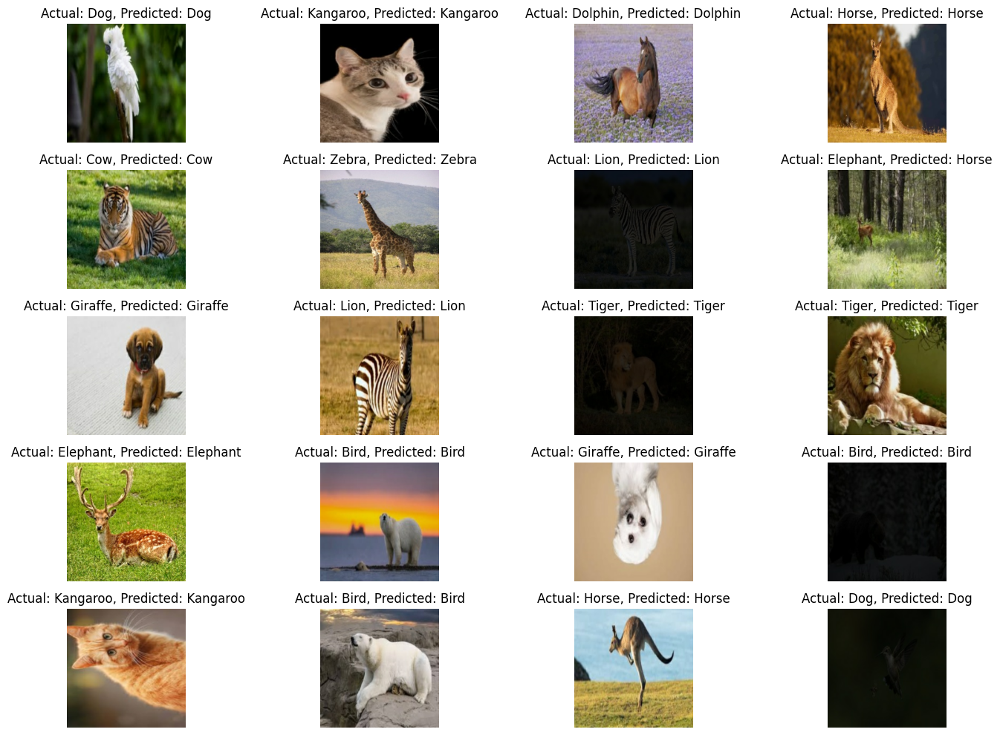

In [ ]:

num_images_to_display = 20
num_columns = 4
num_rows = (num_images_to_display + num_columns - 1) // num_columns

fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 10))
for i, ax in enumerate(axes.flat):
    if i < num_images_to_display:
        ax.imshow(x_test[i])
        actual_label = classes[np.argmax(y_test[i])]
        predicted_label = classes[np.argmax(pred[i])]
        ax.set_title(f"Actual: {actual_label}, Predicted: {predicted_label}")
        ax.axis('off')
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

# **Plotting the Graph**


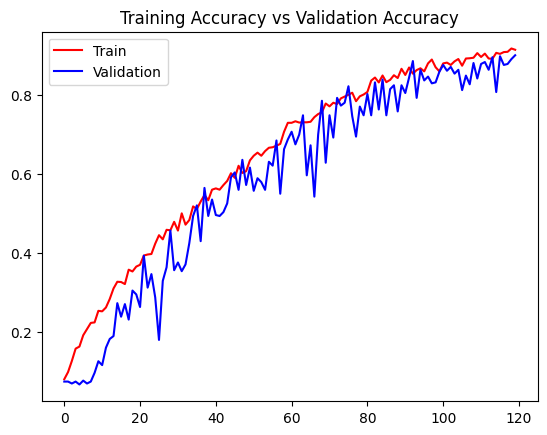

In [ ]:
# Plotting the graph of Accuracy and Validation Accuracy
plt.title('Training Accuracy vs Validation Accuracy')

plt.plot(history.history['accuracy'], color='red',label='Train')
plt.plot(history.history['val_accuracy'], color='blue',label='Validation')

plt.legend()

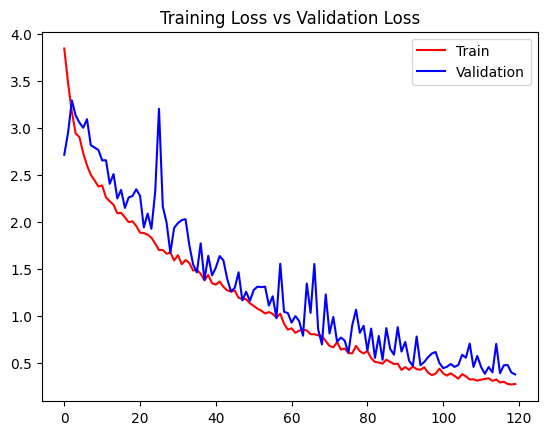

In [ ]:
# Plotting the graph of Accuracy and Validation loss
plt.title('Training Loss vs Validation Loss')

plt.plot(history.history['loss'], color='red',label='Train')
plt.plot(history.history['val_loss'], color='blue',label='Validation')

plt.legend()

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization, Resizing
from tensorflow.keras.optimizers import Adam

# 📌 Load Pretrained MobileNetV2 (without the top layer)
# Change the input shape to (256, 256, 3) or resize your images to (224, 224, 3)
base_model = MobileNetV2(weights="imagenet", include_top=False, input_shape=(256, 256, 3))

# ❌ Freeze base model (initial training)
base_model.trainable = False

# ⚡ Build the Model
model2 = Sequential([
    base_model,
    Resizing(224, 224),  # Resize the output of MobileNetV2 to (224, 224)
    GlobalAveragePooling2D(),
    BatchNormalization(),
    Dense(128, activation='relu'),
    Dropout(0.4),
    Dense(64, activation='relu'),
    Dropout(0.3),
    Dense(15, activation='softmax')  # Change 15 to match your class count
])

# ⚙️ Compile the Model
model2.compile(optimizer=Adam(learning_rate=0.0005),
              loss="categorical_crossentropy",
              metrics=["accuracy"])

# 🔍 Model Summary
model2.summary()

<ipython-input-11-acf0d8e22299>:9: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(weights="imagenet", include_top=False, input_shape=(256, 256, 3))


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224 (Functional)    │ (None, 8, 8, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ resizing (Resizing)                  │ (None, 224, 224, 1280)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 1280)                │           5,120 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 128)                 │         163,968 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 15)                  │             975 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,436,303 (9.29 MB)

 Trainable params: 175,759 (686.56 KB)

 Non-trainable params: 2,260,544 (8.62 MB)

In [ ]:
history = model2.fit(x_train, y_train, batch_size=32, epochs=10,
          validation_data=(x_test, y_test))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 43s 909ms/step - accuracy: 0.9517 - loss: 0.1662 - val_accuracy: 0.9412 - val_loss: 0.1883
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 82s 900ms/step - accuracy: 0.9526 - loss: 0.1680 - val_accuracy: 0.9436 - val_loss: 0.1762
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 43s 897ms/step - accuracy: 0.9524 - loss: 0.1630 - val_accuracy: 0.9559 - val_loss: 0.1726
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 82s 903ms/step - accuracy: 0.9520 - loss: 0.1464 - val_accuracy: 0.9559 - val_loss: 0.1658
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 82s 902ms/step - accuracy: 0.9469 - loss: 0.1648 - val_accuracy: 0.9510 - val_loss: 0.1636
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 82s 903ms/step - accuracy: 0.9617 - loss: 0.1281 - val_accuracy: 0.9510 - val_loss: 0.1710
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 43s 896ms/step - accuracy: 0.9620 - loss: 0.1335 - val_accuracy: 0.9412 - val_loss: 0.1802
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 82s 903ms/step - accuracy: 0.9666 - loss: 0.1162 - val_accu

In [ ]:
loss, accuracy = model2.evaluate(x_test, y_test)
print('Test accuracy:', accuracy)
pred = model2.predict(x_test)

13/13 ━━━━━━━━━━━━━━━━━━━━ 9s 661ms/step - accuracy: 0.9639 - loss: 0.1584
Test accuracy: 0.9534313678741455
13/13 ━━━━━━━━━━━━━━━━━━━━ 15s 946ms/step


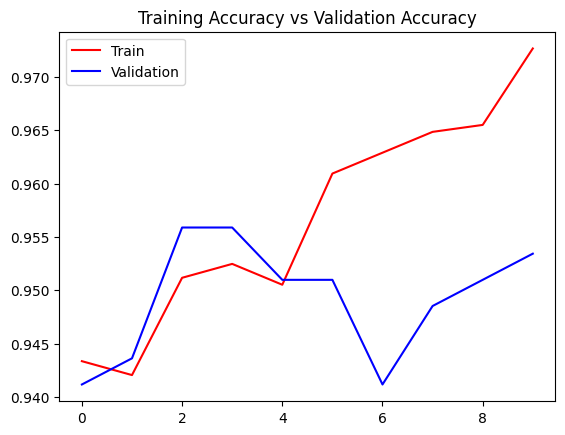

In [ ]:
# Plotting the graph of Accuracy and Validation Accuracy
import matplotlib.pyplot as plt

plt.title('Training Accuracy vs Validation Accuracy')

plt.plot(history.history['accuracy'], color='red',label='Train')
plt.plot(history.history['val_accuracy'], color='blue',label='Validation')

plt.legend()

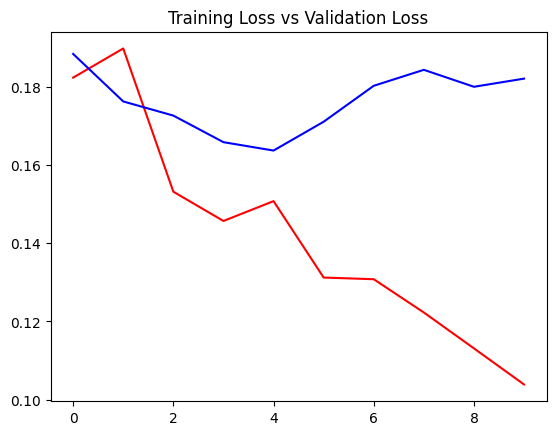

In [ ]:
# Plotting the graph of Accuracy and Validation loss
plt.title('Training Loss vs Validation Loss')

plt.plot(history.history['loss'], color='red',label='Train')
plt.plot(history.history['val_loss'], color='blue',label='Validation')


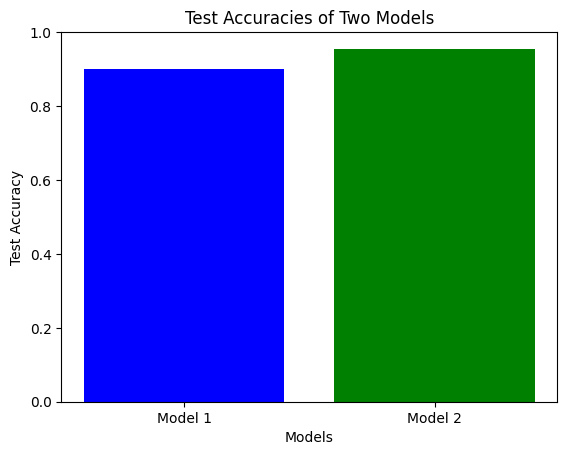

In [ ]:
#comparing both models accuracy
import matplotlib.pyplot as plt

# Test accuracies of two models
models = ['Model 1', 'Model 2']
accuracies = [0.8995097875595093, 0.9534313678741455]

# Plotting the accuracies
plt.bar(models, accuracies, color=['blue', 'green'])

# Adding labels and title
plt.xlabel("Models")
plt.ylabel("Test Accuracy")
plt.title("Test Accuracies of Two Models")
plt.ylim(0, 1)

# Display the plot
plt.show()